In [1]:
import numpy as np
from numpy import array
import pandas as pd
import matplotlib.pyplot as plt #get_ipython().run_line_magic('matplotlib', 'inline')
import string
import os
from PIL import Image
import glob
from pickle import dump, load
from time import time
from keras.preprocessing import sequence
from keras.models import Sequential
from keras.layers import LSTM, Embedding, TimeDistributed, Dense, RepeatVector,                         Activation, Flatten, Reshape, concatenate, Dropout, BatchNormalization, GRU
from keras.optimizers import Adam, RMSprop
from keras.layers.wrappers import Bidirectional
from keras.layers.merge import add
from keras.applications.inception_v3 import InceptionV3
from keras.preprocessing import image
from keras.models import Model
from keras import Input, layers
from keras import optimizers
from keras.applications.inception_v3 import preprocess_input
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical
import json
import csv

from keras.optimizers import SGD
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint


Using TensorFlow backend.
/Users/vinutahegde/Documents/USC/SEM3/DL/project/ws/404/404/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/Users/vinutahegde/Documents/USC/SEM3/DL/project/ws/404/404/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/Users/vinutahegde/Documents/USC/SEM3/DL/project/ws/404/404/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)typ

In [2]:
ROOT_DIR = "/Users/vinutahegde/Documents/USC/SEM3/DL/project/ws/"
IMAGE_EMBEDDING_DIR = ROOT_DIR#+"imageGroupsOutput/"
IMAGE_EMBEDDING_VAL_DIR = ROOT_DIR
GLOVE_EMBEDDING_FILE_NAME = ROOT_DIR+'glove.6B.300d.txt'
TEST_IMAGE_DIR = ROOT_DIR + "images/train/images/train/"
GLOVE_EMBEDDING_FILE_NAME = 'glove.6B.50d.txt'
CAPTION_FILE_NAME = ROOT_DIR+'image_to_caption.csv'
weight_filepath = ROOT_DIR+'weights/nov_25_v2-ep{epoch:03d}-loss{loss:.3f}.h5'

SEED = 10
NUM_IMAGE_EMBEDDING_CHUNKS = 1
MAX_SEQUENCE_LENGTH = 12
WORD_EMBEDDING_DIM = 50
BATCH_SIZE = 32

In [3]:
def getCaptions(id_list):
    caption_dict = {}
    with open(CAPTION_FILE_NAME) as csv_file:
        csv_reader = csv.reader(csv_file, delimiter=',')
        line_count = 0
        for row in csv_reader:
            if row[1] in id_list:
                caption_dict[row[1]] = row[2]
    return caption_dict

In [4]:
def vocab_fun(captions):
    index_to_word = {}
    word_to_index = {}
    all_words = {}
    all_words['startseq'] = 1
    all_words['endseq'] = 1
    for img_id, cap in captions.items():
        for word in cap.split():
            all_words[word] = 1    
    all_vocab=[w for w in all_words]
    index = 1
    for word in all_vocab:
        word_to_index[word] = index
        index_to_word[index] = word
        index += 1
    return (all_vocab, word_to_index, index_to_word)

In [5]:
def Merge(dict1, dict2): 
    res = {**dict1, **dict2} 
    return res 

def getImageEmbedding(path):
    image_embedding = {}
    for i in range(NUM_IMAGE_EMBEDDING_CHUNKS):
        file_name = path + 'cnn_group'+str(i+1)+'.json'
        with open(file_name) as json_file:
            json_data = json.load(json_file)
            json_data = json.loads(json_data)
            image_embedding = Merge(image_embedding, json_data) 
    print(len(image_embedding))
    return image_embedding

In [6]:
import numpy as np
import keras

class DataGenerator(keras.utils.Sequence):
    'Generates data for Keras'
    def __init__(self, list_IDs, image_embedding, captions, batch_size=32, num_caption=12, image_dim= 2048, shuffle=True, vocab_size = 5000):
        'Initialization'
        self.image_dim = image_dim
        self.num_caption = num_caption
        self.batch_size = batch_size
        self.list_IDs = list_IDs
        self.shuffle = shuffle
        self.image_embedding = image_embedding
        self.captions = captions
        self.vocab_size = vocab_size
        self.on_epoch_end()

    def someFunction(self,list_IDs_temp):
        return self.__data_generation(list_IDs_temp)
    
    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.list_IDs) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

        list_IDs_temp = [self.list_IDs[k] for k in indexes]
        X1,X2, y = self.__data_generation(list_IDs_temp)
        return [X1,X2], y

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.list_IDs))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __data_generation(self, list_IDs_temp):
        'Generates data containing batch_size samples' 
        X1 = np.empty((self.batch_size, self.image_dim))
        X2 = np.empty((self.batch_size, self.num_caption))
        Y = np.empty((self.batch_size, self.num_caption))

        for i, ID in enumerate(list_IDs_temp):
            X1[i,] = self.image_embedding[ID]
            desc = self.captions[ID]

            desc_in = "startseq " + desc
            seq_in = [wordtoix[word] for word in desc_in.split() if word in wordtoix]
            seq_in = pad_sequences([seq_in], maxlen=MAX_SEQUENCE_LENGTH, padding='post', truncating='post')[0]
            X2[i,] = seq_in

            desc_out = desc+ " endseq"
            seq_out = [wordtoix[word] for word in desc_out.split() if word in wordtoix]
            seq_out = pad_sequences([seq_out], maxlen=MAX_SEQUENCE_LENGTH, padding='post', truncating='post')[0]

            if len(seq_out) >= MAX_SEQUENCE_LENGTH:
                seq_out[-1]=wordtoix['endseq']
            Y[i] = seq_out


        return X1, X2, keras.utils.to_categorical(Y, num_classes=self.vocab_size)

In [7]:
embeddings_index = {} 
f = open(GLOVE_EMBEDDING_FILE_NAME, encoding="utf-8")

for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()
print('Found %s word vectors.' % len(embeddings_index))

Found 400000 word vectors.


In [8]:
image_embeddings =  getImageEmbedding(IMAGE_EMBEDDING_DIR)

print(len(image_embeddings))
image_ids = list(image_embeddings.keys())

caption_map = getCaptions(image_ids)
all_vocab, wordtoix, ixtoword=vocab_fun(caption_map)
vocab_size =  len(all_vocab)+1
partition = {}
partition['train'] = image_ids[:int((len(image_ids)+1)*.90)] #Remaining 90% to training set
partition['validation'] = image_ids[int(len(image_ids)*.90+1):] #Splits 10% data to test setgetCaptions(image_ids)

params = {'num_caption': MAX_SEQUENCE_LENGTH,
          'image_dim' : 2048,
          'batch_size': BATCH_SIZE,
          'shuffle': True,
          'vocab_size':vocab_size }




5803
5803


In [9]:

training_generator = DataGenerator(partition['train'], image_embeddings, caption_map , **params)
validation_generator = DataGenerator(partition['validation'], image_embeddings, caption_map, **params)

x =image_ids[:32]
# print(x)
train_X1, train_X2, train_Y = training_generator.someFunction(x)
print(train_X1.shape)
print(train_X2.shape)
print(train_Y.shape)

(32, 2048)
(32, 12)
(32, 12, 5606)


In [10]:
vocab_size = len(all_vocab)+1
print('Vocabulary Size: %d' % vocab_size)

Vocabulary Size: 5606


In [11]:
embedding_matrix = np.zeros((vocab_size, WORD_EMBEDDING_DIM))
for word, i in wordtoix.items():
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector

In [12]:
def build_model():
  inputs1 = Input(shape=(2048,),name='images')
  fe1 = Dropout(0.5)(inputs1)
  fe2 = Dense(256, activation='relu')(fe1)
  inputs2 = Input(shape=(MAX_SEQUENCE_LENGTH,),name='sequences')
  se1 = Embedding(vocab_size, WORD_EMBEDDING_DIM, mask_zero=True, weights=[embedding_matrix], trainable=False)(inputs2)
  se2 = Dropout(0.5)(se1)
  se3 = GRU(256, return_sequences=True)(se2, initial_state=fe2)
#   decoder1 = add([fe2, se3])
  decoder2 = Dense( 256, activation=None)(se3)
  outputs = Dense(vocab_size, activation='softmax')(decoder2)
#   outputs = Dense(vocab_size, activation='linear')(decoder2)
  model = Model(inputs=[inputs1, inputs2], outputs=outputs)
  return model

In [13]:
model=build_model()
model.summary()
optz = optimizers.adam(lr = 0.001, beta_1 = 0.9, beta_2 = 0.999, clipnorm = 1.0, clipvalue = 0.5)
# decoder_target = tf.placeholder(dtype='int32', shape=(None,None))
# model.compile(loss=sparse_cross_entropy, optimizer='adam', target_tensors=[decoder_target])#'adam')
model.compile(loss='categorical_crossentropy', optimizer=optz)

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
sequences (InputLayer)          (None, 12)           0                                            
__________________________________________________________________________________________________
images (InputLayer)             (None, 2048)         0                                            
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 12, 50)       280300      sequences[0][0]                  
__________________________________________________________________________________________________
dropout_1 (Dropout)             (None, 2048)         0           images[0][0]                    

In [14]:
# X1train, X2train, ytrain = data_generator(caption_map, image_embd, wordtoix, vocab_size) #(descriptions, photos, wordtoix, num_photos_per_batch)
# print(X1train.shape)
# print(X2train.shape)
# print(ytrain.shape)
# filepath_checkpoint = weight_filepath
# checkpoint = ModelCheckpoint(filepath_checkpoint, monitor='val_loss', verbose=1, save_best_only=False, mode='min')
# history = model.fit([X1train, X2train], ytrain, epochs=5, verbose=1, batch_size=64, callbacks=[checkpoint], validation_split=0.1, shuffle=True, workers=10, use_multiprocessing=True)
# model.save('fit_adam_50d_1_split_finale.h5')

# training_generator = DataGenerator(partition['train'], image_embeddings, caption_map , **params)
# validation_generator = DataGenerator(partition['validation'], image_embeddings, caption_map, **params)

history =filepath_checkpoint = weight_filepath
checkpoint = ModelCheckpoint(filepath_checkpoint, monitor='val_loss', verbose=1, save_best_only=False, mode='min')
history = model.fit(training_generator,validation_data=validation_generator,verbose=1)


Epoch 1/1
163/163 [==============================] - 24s 145ms/step - loss: 5.0751 - val_loss: 4.3937


dict_keys(['val_loss', 'loss'])


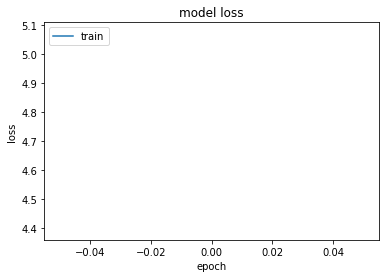

<Figure size 432x288 with 0 Axes>

In [15]:
import matplotlib.pyplot as plt
print(history.history.keys())
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train'], loc='upper left')
plt.show()
plt.savefig('both_clip_and_norm_no_relu_1.png')

In [17]:
history = model.fit(training_generator,validation_data=validation_generator,verbose=1,epochs=50)
model.save('nov_28_pretty_okay_base_model_2_1.h5')

Epoch 1/50
163/163 [==============================] - 66s 404ms/step - loss: 4.0609 - val_loss: 4.5780
Epoch 2/50
163/163 [==============================] - 78s 476ms/step - loss: 3.9678 - val_loss: 4.5685
Epoch 3/50
163/163 [==============================] - 86s 527ms/step - loss: 3.8935 - val_loss: 4.1352
Epoch 4/50
163/163 [==============================] - 85s 522ms/step - loss: 3.8162 - val_loss: 4.1957
Epoch 5/50
163/163 [==============================] - 72s 443ms/step - loss: 3.7407 - val_loss: 4.4896
Epoch 6/50
163/163 [==============================] - 66s 406ms/step - loss: 3.6702 - val_loss: 4.5827
Epoch 7/50
163/163 [==============================] - 72s 444ms/step - loss: 3.6120 - val_loss: 4.7056
Epoch 8/50
163/163 [==============================] - 69s 425ms/step - loss: 3.5556 - val_loss: 4.2253
Epoch 9/50
163/163 [==============================] - 69s 425ms/step - loss: 3.4950 - val_loss: 4.3754
Epoch 10/50
163/163 [==============================] - 74s 452ms/step - l

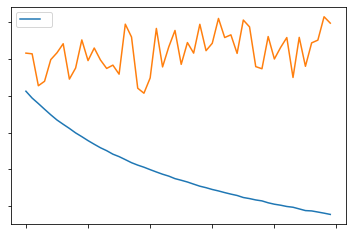

<Figure size 432x288 with 0 Axes>

In [18]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train'], loc='upper left')
plt.show()
plt.savefig('both_clip_and_norm_no_relu_1.png')

In [24]:
history = model.fit(training_generator,validation_data=validation_generator,verbose=1,epochs=50)
model.save('nov_28_pretty_okay_base_model_2_2.h5')

Epoch 1/50
163/163 [==============================] - 130s 798ms/step - loss: 2.3747 - val_loss: 4.9093
Epoch 2/50
163/163 [==============================] - 131s 806ms/step - loss: 2.3596 - val_loss: 4.5521
Epoch 3/50
163/163 [==============================] - 140s 861ms/step - loss: 2.3473 - val_loss: 4.7246
Epoch 4/50
163/163 [==============================] - 128s 785ms/step - loss: 2.3342 - val_loss: 4.7333
Epoch 5/50
163/163 [==============================] - 139s 855ms/step - loss: 2.3190 - val_loss: 4.6839
Epoch 6/50
163/163 [==============================] - 114s 698ms/step - loss: 2.3049 - val_loss: 4.6227
Epoch 7/50
163/163 [==============================] - 112s 687ms/step - loss: 2.2984 - val_loss: 4.7680
Epoch 8/50
163/163 [==============================] - 115s 704ms/step - loss: 2.2787 - val_loss: 4.5175
Epoch 9/50
163/163 [==============================] - 122s 749ms/step - loss: 2.2681 - val_loss: 5.4288
Epoch 10/50
163/163 [==============================] - 127s 778m

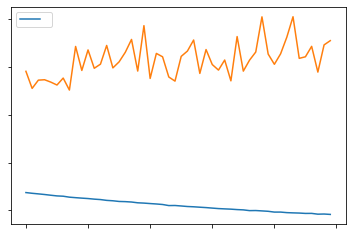

<Figure size 432x288 with 0 Axes>

In [25]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train'], loc='upper left')
plt.show()
plt.savefig('both_clip_and_norm_no_relu_2.png')

Epoch 1/20
163/163 [==============================] - 23s 139ms/step - loss: 1.9071 - val_loss: 5.4791
Epoch 2/20
163/163 [==============================] - 22s 134ms/step - loss: 1.9028 - val_loss: 4.5695
Epoch 3/20
163/163 [==============================] - 20s 125ms/step - loss: 1.8958 - val_loss: 4.9991
Epoch 4/20
163/163 [==============================] - 21s 127ms/step - loss: 1.8807 - val_loss: 5.0031
Epoch 5/20
163/163 [==============================] - 18s 113ms/step - loss: 1.8792 - val_loss: 5.4608
Epoch 6/20
163/163 [==============================] - 21s 128ms/step - loss: 1.8749 - val_loss: 5.7658
Epoch 7/20
163/163 [==============================] - 21s 131ms/step - loss: 1.8704 - val_loss: 5.0581
Epoch 8/20
163/163 [==============================] - 18s 113ms/step - loss: 1.8668 - val_loss: 5.8301
Epoch 9/20
163/163 [==============================] - 20s 124ms/step - loss: 1.8560 - val_loss: 5.4909
Epoch 10/20
163/163 [==============================] - 19s 115ms/step - l

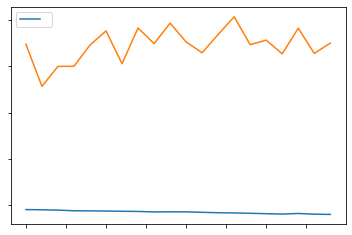

<Figure size 432x288 with 0 Axes>

In [45]:
history = model.fit(training_generator,validation_data=validation_generator,verbose=1,epochs=20)
model.save('nov_28_pretty_okay_base_model_2_3.h5')
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train'], loc='upper left')
plt.show()
plt.savefig('both_clip_and_norm_no_relu_3.png')

Epoch 1/20
163/163 [==============================] - 19s 116ms/step - loss: 1.7917 - val_loss: 5.5064
Epoch 2/20
163/163 [==============================] - 19s 116ms/step - loss: 1.7926 - val_loss: 6.0301
Epoch 3/20
163/163 [==============================] - 19s 116ms/step - loss: 1.7869 - val_loss: 5.6260
Epoch 4/20
163/163 [==============================] - 20s 122ms/step - loss: 1.7807 - val_loss: 5.2210
Epoch 5/20
163/163 [==============================] - 19s 115ms/step - loss: 1.7762 - val_loss: 6.0963
Epoch 6/20
163/163 [==============================] - 19s 116ms/step - loss: 1.7755 - val_loss: 5.7597
Epoch 7/20
163/163 [==============================] - 19s 116ms/step - loss: 1.7651 - val_loss: 5.2832
Epoch 8/20
163/163 [==============================] - 19s 115ms/step - loss: 1.7571 - val_loss: 5.6941
Epoch 9/20
163/163 [==============================] - 21s 127ms/step - loss: 1.7547 - val_loss: 5.2660
Epoch 10/20
163/163 [==============================] - 20s 121ms/step - l

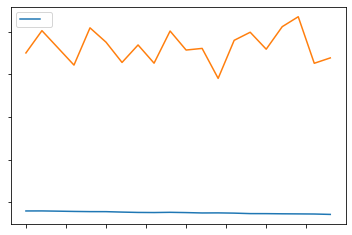

<Figure size 432x288 with 0 Axes>

In [58]:
history = model.fit(training_generator,validation_data=validation_generator,verbose=1,epochs=20)
model.save('nov_28_pretty_okay_base_model_2_4.h5')
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train'], loc='upper left')
plt.show()
plt.savefig('both_clip_and_norm_no_relu_4.png')
#this was the bast 

Epoch 1/50
163/163 [==============================] - 20s 121ms/step - loss: 1.7124 - val_loss: 5.3242
Epoch 2/50
163/163 [==============================] - 19s 115ms/step - loss: 1.7093 - val_loss: 6.3106
Epoch 3/50
163/163 [==============================] - 20s 122ms/step - loss: 1.7009 - val_loss: 5.6920
Epoch 4/50
163/163 [==============================] - 19s 116ms/step - loss: 1.6958 - val_loss: 5.3776
Epoch 5/50
163/163 [==============================] - 20s 120ms/step - loss: 1.6967 - val_loss: 5.5816
Epoch 6/50
163/163 [==============================] - 19s 114ms/step - loss: 1.6905 - val_loss: 6.4545
Epoch 7/50
163/163 [==============================] - 19s 115ms/step - loss: 1.6927 - val_loss: 5.7605
Epoch 8/50
163/163 [==============================] - 18s 112ms/step - loss: 1.6925 - val_loss: 5.7260
Epoch 9/50
163/163 [==============================] - 19s 118ms/step - loss: 1.6715 - val_loss: 6.3330
Epoch 10/50
163/163 [==============================] - 18s 112ms/step - l

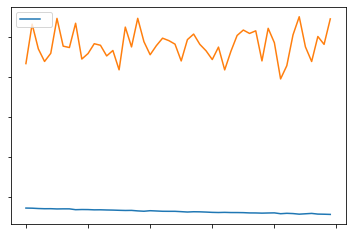

<Figure size 432x288 with 0 Axes>

In [70]:
history = model.fit(training_generator,validation_data=validation_generator,verbose=1,epochs=50)
model.save('nov_28_pretty_okay_base_model_2_5.h5')
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train'], loc='upper left')
plt.show()
plt.savefig('both_clip_and_norm_no_relu_5.png')

Epoch 1/20
163/163 [==============================] - 20s 123ms/step - loss: 1.5617 - val_loss: 6.4817
Epoch 2/20
163/163 [==============================] - 22s 135ms/step - loss: 1.5571 - val_loss: 5.9005
Epoch 3/20
163/163 [==============================] - 27s 168ms/step - loss: 1.5521 - val_loss: 6.0514
Epoch 4/20
163/163 [==============================] - 24s 147ms/step - loss: 1.5482 - val_loss: 6.2434
Epoch 5/20
163/163 [==============================] - 27s 163ms/step - loss: 1.5436 - val_loss: 5.7847
Epoch 6/20
163/163 [==============================] - 24s 147ms/step - loss: 1.5443 - val_loss: 5.1993
Epoch 7/20
163/163 [==============================] - 24s 147ms/step - loss: 1.5414 - val_loss: 6.2314
Epoch 8/20
163/163 [==============================] - 26s 160ms/step - loss: 1.5301 - val_loss: 6.5168
Epoch 9/20
163/163 [==============================] - 24s 149ms/step - loss: 1.5331 - val_loss: 6.1594
Epoch 10/20
163/163 [==============================] - 25s 156ms/step - l

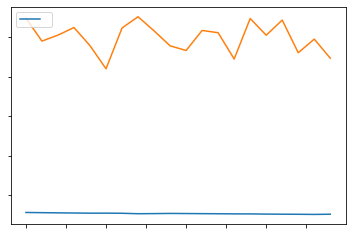

<Figure size 432x288 with 0 Axes>

In [84]:
history = model.fit(training_generator,validation_data=validation_generator,verbose=1,epochs=20)
model.save('nov_28_pretty_okay_base_model_2_6.h5')
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train'], loc='upper left')
plt.show()
plt.savefig('both_clip_and_norm_no_relu_6.png')

Epoch 1/100
163/163 [==============================] - 26s 159ms/step - loss: 1.5123 - val_loss: 5.7945
Epoch 2/100
163/163 [==============================] - 26s 158ms/step - loss: 1.5120 - val_loss: 6.4199
Epoch 3/100
163/163 [==============================] - 23s 142ms/step - loss: 1.5085 - val_loss: 5.9183
Epoch 4/100
163/163 [==============================] - 21s 132ms/step - loss: 1.5000 - val_loss: 5.8633
Epoch 5/100
163/163 [==============================] - 21s 128ms/step - loss: 1.4964 - val_loss: 6.1508
Epoch 6/100
163/163 [==============================] - 23s 141ms/step - loss: 1.5036 - val_loss: 6.2945
Epoch 7/100
163/163 [==============================] - 23s 143ms/step - loss: 1.5000 - val_loss: 6.8137
Epoch 8/100
163/163 [==============================] - 24s 149ms/step - loss: 1.4892 - val_loss: 5.5468
Epoch 9/100
163/163 [==============================] - 26s 160ms/step - loss: 1.4874 - val_loss: 5.8729
Epoch 10/100
163/163 [==============================] - 30s 183m

163/163 [==============================] - 30s 185ms/step - loss: 1.3761 - val_loss: 6.5138
Epoch 80/100
163/163 [==============================] - 34s 207ms/step - loss: 1.3778 - val_loss: 6.8755
Epoch 81/100
163/163 [==============================] - 39s 236ms/step - loss: 1.3727 - val_loss: 6.2098
Epoch 82/100
163/163 [==============================] - 30s 187ms/step - loss: 1.3761 - val_loss: 6.4306
Epoch 83/100
163/163 [==============================] - 29s 178ms/step - loss: 1.3733 - val_loss: 6.0355
Epoch 84/100
163/163 [==============================] - 28s 175ms/step - loss: 1.3733 - val_loss: 6.0117
Epoch 85/100
163/163 [==============================] - 31s 188ms/step - loss: 1.3703 - val_loss: 6.1927
Epoch 86/100
163/163 [==============================] - 28s 173ms/step - loss: 1.3597 - val_loss: 6.2481
Epoch 87/100
163/163 [==============================] - 32s 196ms/step - loss: 1.3709 - val_loss: 6.5234
Epoch 88/100
163/163 [==============================] - 29s 178ms/st

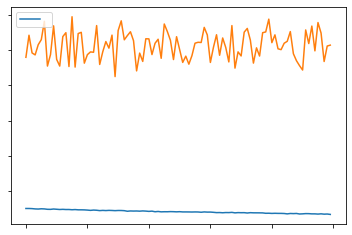

<Figure size 432x288 with 0 Axes>

In [96]:
history = model.fit(training_generator,validation_data=validation_generator,verbose=1,epochs=100)
model.save('nov_28_pretty_okay_base_model_2_7.h5')
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train'], loc='upper left')
plt.show()
plt.savefig('both_clip_and_norm_no_relu_7.png')

In [46]:
from keras.models import load_model
model = load_model('nov_28_pretty_okay_base_model_2_4.h5')

In [47]:
import os.path as osp
import os
from pprint import pprint
from skimage.transform import rescale, resize
from skimage import data, color, io
import skimage
import PIL
import scipy
import json
import os.path
from os import path
import tensorflow as tf

from keras.applications.xception import preprocess_input
from keras.applications.xception import Xception
from keras.models import Model
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import load_img
from keras.applications.imagenet_utils import decode_predictions
def word_for_id(integer, tokenizer):
    for word, index in tokenizer.word_index.items():
        if index == integer:
            return word
    return None
def load_image(image_path,target_size):
    img = skimage.io.imread(image_path)
    image_resized = skimage.transform.resize(img, target_size, anti_aliasing=True)
    return image_resized

def load_cnn_model():
    model = Xception()
    model.layers.pop()
    model = Model(inputs=model.inputs, outputs=model.layers[-1].output)
    return model

def extract_features_from_images(image_path):
    model = load_cnn_model()
#     if path.exists(image_path):
    image = load_image(image_path, target_size=(299, 299))
    if image.shape == (299, 299, 3):
        image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
        image = preprocess_input(image)
        feature = model.predict(image, verbose=0)
        return feature

def generate_desc(model, photo, max_length):
    in_text = 'startseq '
    for i in range(max_length):
            seq_in = [int(wordtoix[word]) for word in in_text.split() if word in wordtoix]
            seq_in = pad_sequences([seq_in], maxlen=MAX_SEQUENCE_LENGTH, padding='post')[0]
            yhat = model.predict([photo,seq_in[np.newaxis,...]], verbose=0)
            yhat = yhat[0,i,:]
            yhat = np.argmax(yhat)
            word = ixtoword[yhat]
            if word is None:
                break
            in_text += ' ' + word
            if word == 'endseq':
                break
    return in_text

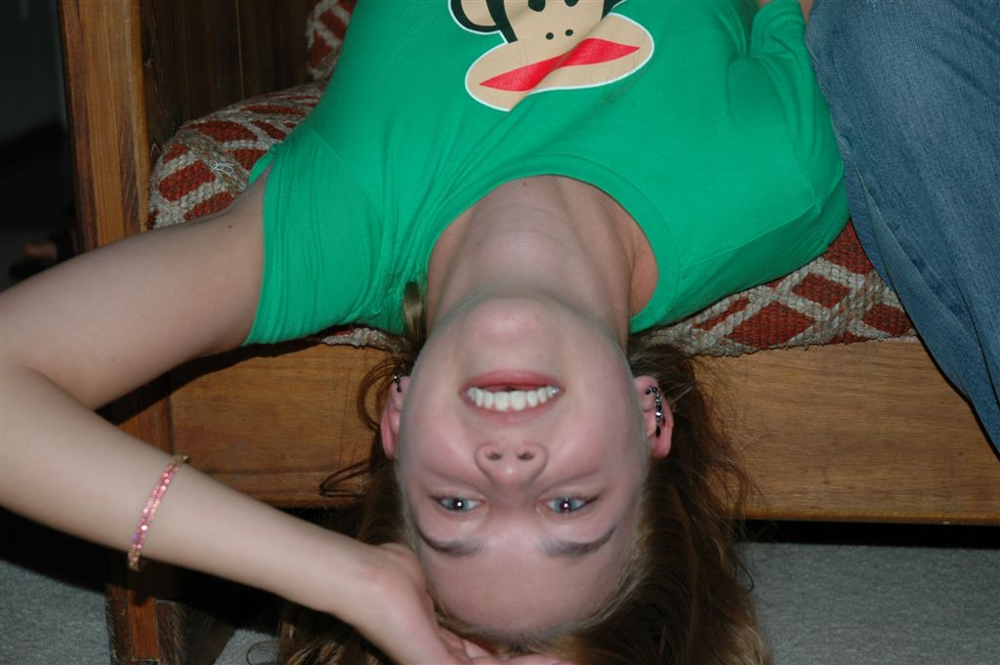

In [48]:
image_path= TEST_IMAGE_DIR+'124919.jpg'#'/Users/vinutahegde/Documents/Personal/IMG_3501.JPG'
from IPython.display import Image
Image(filename=image_path)

In [49]:
feature=extract_features_from_images(image_path)
print(feature)
print(generate_desc(model, feature, MAX_SEQUENCE_LENGTH))


[[0.         0.         0.14329363 ... 0.13233422 0.         0.        ]]
startseq  the people were smiling at the park endseq


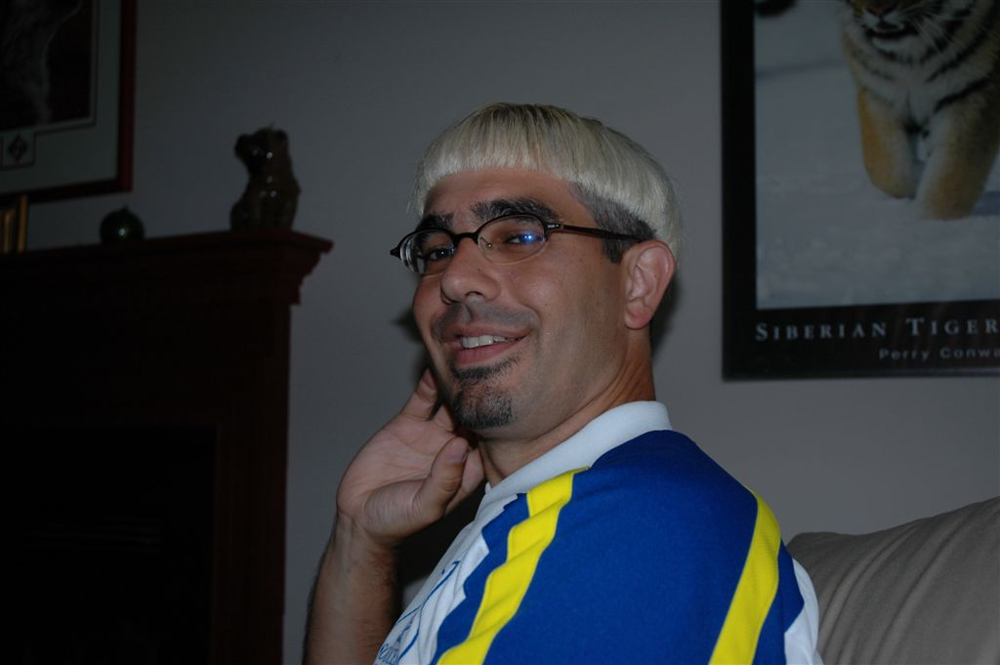

In [50]:
image_path=TEST_IMAGE_DIR +'124871.jpg'
from IPython.display import Image
Image(filename=image_path)

In [51]:
feature=extract_features_from_images(image_path)
print()
print(generate_desc(model, feature, MAX_SEQUENCE_LENGTH))


startseq  the people were smiling at the park endseq


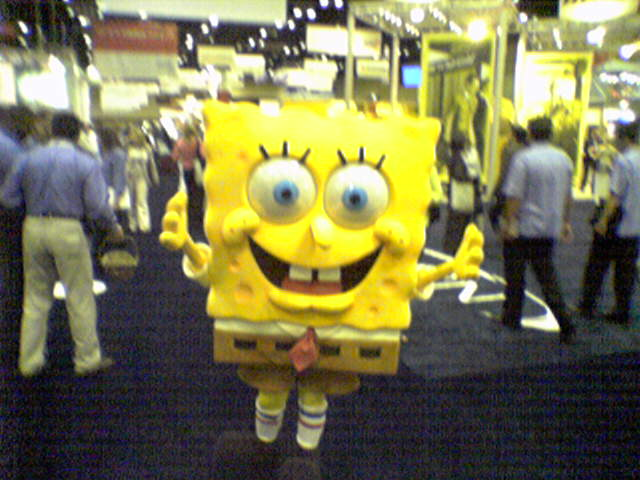

In [52]:
image_path=TEST_IMAGE_DIR +'141090.jpg'
from IPython.display import Image
Image(filename=image_path)

In [53]:
image_path=TEST_IMAGE_DIR +'141090.jpg'
feature=extract_features_from_images(image_path)
print()
print(generate_desc(model, feature, MAX_SEQUENCE_LENGTH))


startseq  the kids were filled in anticipation . endseq


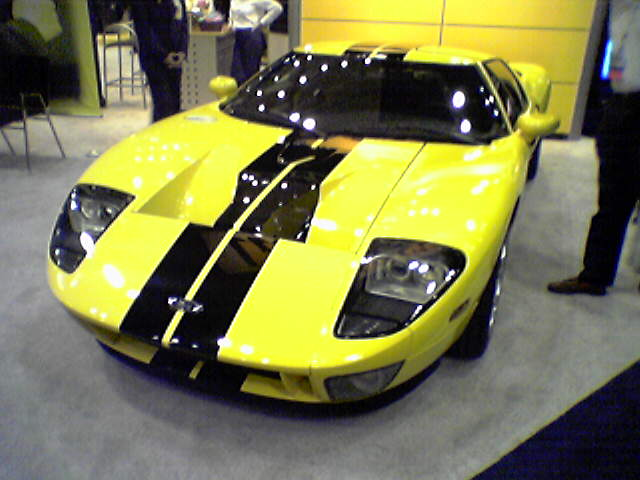

In [54]:
image_path=TEST_IMAGE_DIR +'141055.jpg'
from IPython.display import Image
Image(filename=image_path)

In [55]:
feature=extract_features_from_images(image_path)
print()
print(generate_desc(model, feature, MAX_SEQUENCE_LENGTH))


startseq  the ceremony included the car show off the sign . endseq


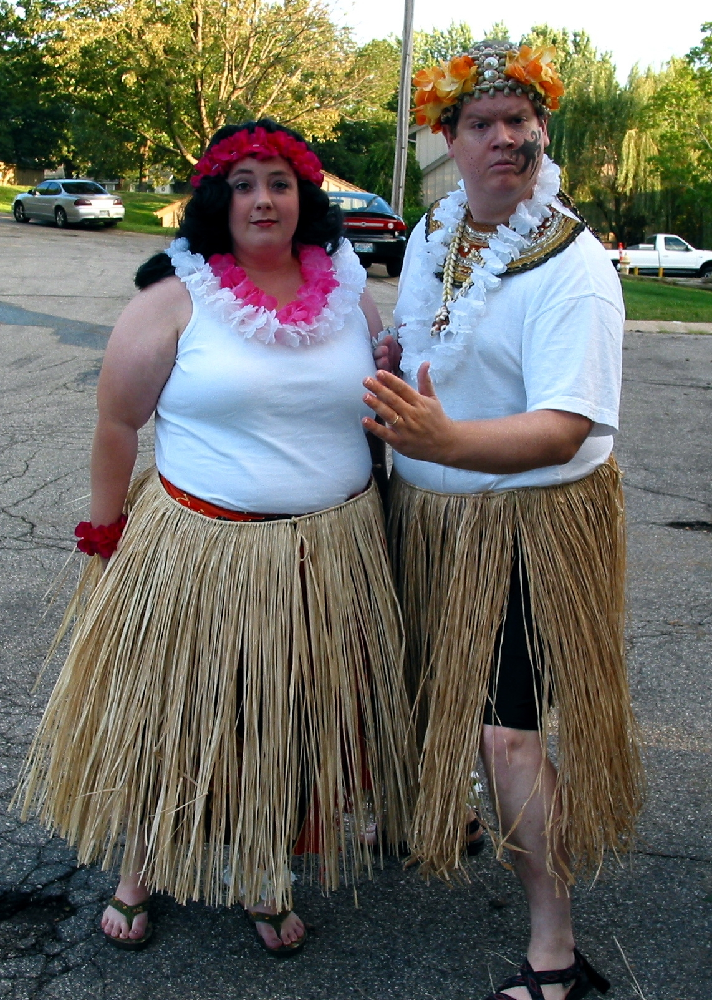

In [56]:
image_path=TEST_IMAGE_DIR +'306268.jpg'
from IPython.display import Image
Image(filename=image_path)

In [57]:
feature=extract_features_from_images(image_path)
print()
print(generate_desc(model, feature, MAX_SEQUENCE_LENGTH))


startseq  the people were walking along the big endseq


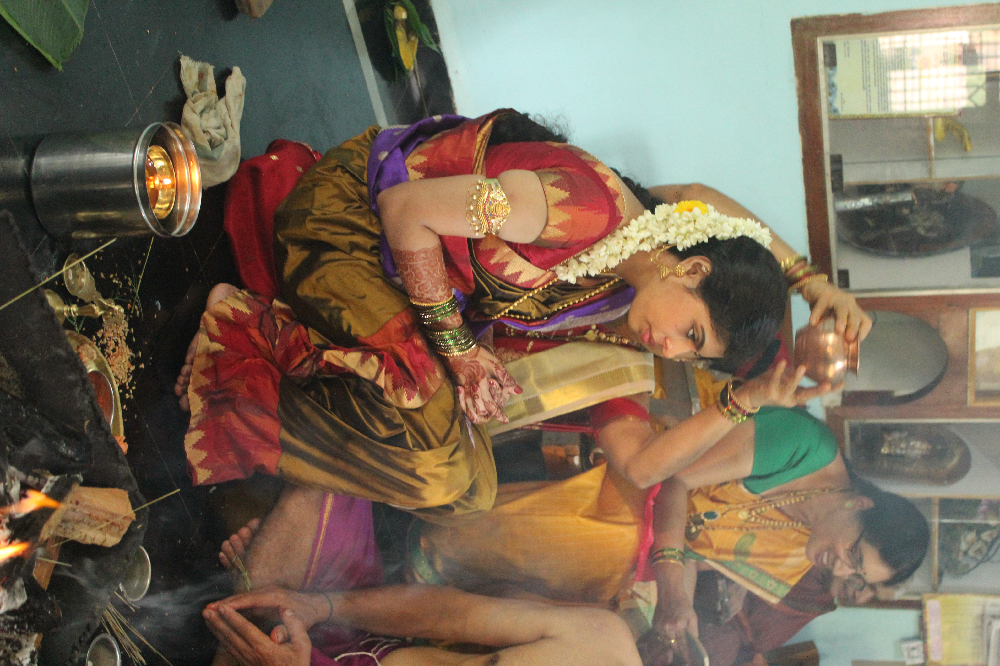

In [58]:
image_path='/Users/vinutahegde/Documents/Personal/IMG_3501.JPG'
from IPython.display import Image
Image(filename=image_path)

In [59]:
feature=extract_features_from_images(image_path)
print()
print(generate_desc(model, feature, MAX_SEQUENCE_LENGTH))


startseq  the people in the audience wanted to get some than free endseq


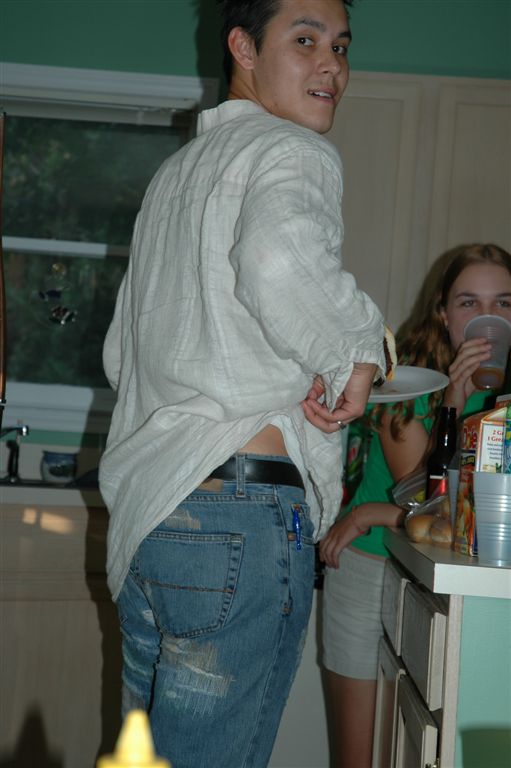

In [60]:
image_path=TEST_IMAGE_DIR +'124879.jpg'
from IPython.display import Image
Image(filename=image_path)

In [61]:
feature=extract_features_from_images(image_path)
print()
print(generate_desc(model, feature, MAX_SEQUENCE_LENGTH))


startseq  the people were smiling at the park endseq


In [79]:
# from keras.models import load_model
# model = load_model('nov_28_pretty_okay_base_model1.h5')
# image_path='/Users/vinutahegde/Documents/Personal/IMG_3501.JPG'
# feature=extract_features_from_images(image_path)
# print()
# print(generate_desc(model, feature, MAX_SEQUENCE_LENGTH))


startseq  the kids were super with and excitement . endseq


In [44]:
# print(caption_map)

{'4562806105': 'i am not sure what kind of hat she is wearing but it looks funky .', '4649754705': 'the two colorful fish greet visitors to the garden .', '4939153829': 'the people were walking along the beach', '4937337186': 'then we hit the carnival for some fun !', '609681173': 'i was always on the go during my trip .', '5303226852': 'the view of the boats and trees was great .', '4477277485': 'the youngest loved playing with his boat in the water .', '4748833643': 'or you can ride the many rides that are all throughout the park .', '4750511401': 'the kids loved the merry-go-round .', '29698564': 'sometimes you have to see what has been done .', '5040754334': 'we came up on the fair from the distance .', '5128758515': 'i wanted to buy this kite but it was too expensive .', '5129333772': '[male] mouse and [male] duck are awesome .', '6797617751': 'hanging out on the water is so relaxing', '6800173629': 'this was the last float of the parade . i was sad to see it end .', '4655952888':